In [1]:
import simpy
import random
import pandas as pd

# 存储每位乘客的等待时间
waiting_time_list = []
# 当前等待的乘客数量
waiting_passengers = 0
# 计算平均等待时间的时间间隔（15分钟以秒为单位）
time_interval = 15 * 60
# 存储每个时间段的等待时间
waiting_time_intervals = []
# 存储每个时间段的平均等待时间
average_waiting_times = []
# 存储每个时间段的开始时间
time_intervals_start = []

def generate_processing_time():
    # 根据指数分布生成处理时间
    return random.expovariate(1 / 20.0)

def security_check(env, passenger_id, security_lanes):
    global waiting_passengers, waiting_time_intervals

    arrival_time = env.now
    waiting_passengers += 1

    # 选择队列最短的安检通道
    shortest_lane = min(security_lanes, key=lambda x: len(x.queue))
    with shortest_lane.request() as request:
        yield request
        processing_start = env.now
        yield env.timeout(generate_processing_time())
        waiting_time = env.now - arrival_time
        waiting_time_list.append(waiting_time)
        waiting_passengers -= 1
        waiting_time_intervals[-1].append(waiting_time)
        print(f"乘客{passenger_id}于{arrival_time}到达")
        print(f"乘客{passenger_id}于{env.now}完成安检（等待时间：{waiting_time}秒）")

def passenger_generator(env, security_lanes, passengers_data):
    for _, passenger in passengers_data.iterrows():
        passenger_id = passenger['Id']
        arrival_time = passenger['ArrivalTime']
        yield env.timeout(arrival_time - env.now)
        env.process(security_check(env, passenger_id, security_lanes))

def adjust_security_lanes(env, security_lanes, security_data):
    for _, row in security_data.iterrows():
        time, lanes = row['Time'], row['Lanes']
        yield env.timeout(time - env.now)
        # 调整活动通道的数量
        while len(security_lanes) < lanes:
            security_lanes.append(simpy.Resource(env, capacity=1))
        while len(security_lanes) > lanes:
            security_lanes.pop()

def calculate_average_waiting_time(env):
    global time_intervals_start
    current_time = 0
    while True:
        yield env.timeout(time_interval)
        current_time += time_interval
        if waiting_time_intervals[-1]:
            avg_waiting_time = sum(waiting_time_intervals[-1]) / len(waiting_time_intervals[-1])
            average_waiting_times.append(avg_waiting_time)
        else:
            average_waiting_times.append(0)
        time_intervals_start.append(current_time - time_interval)
        waiting_time_intervals.append([])
        
def reset_globals():
    global waiting_time_list, waiting_passengers, waiting_time_intervals, average_waiting_times, time_intervals_start
    waiting_time_list = []
    waiting_passengers = 0
    waiting_time_intervals = [[]]
    average_waiting_times = []
    time_intervals_start = []
    
def run_simulation(sim_time, passengers_data, security_data):
    reset_globals()

    env = simpy.Environment()
    initial_lanes = security_data['Lanes'].iloc[0]
    security_lanes = [simpy.Resource(env, capacity=1) for _ in range(initial_lanes)]
    waiting_time_intervals.append([])

    env.process(passenger_generator(env, security_lanes, passengers_data))
    env.process(adjust_security_lanes(env, security_lanes, security_data))
    env.process(calculate_average_waiting_time(env))
    
    env.run(until=sim_time)
    df_avg_waiting_times = pd.DataFrame({'Average Waiting Time': average_waiting_times}, index=time_intervals_start)
    return df_avg_waiting_times

def multiple_run_simulation(runs, sim_time, passengers_data, security_data):
    total_avg_waiting_times = None
    for i in range(runs):
        print(f"正在运行模拟 {i+1}/{runs}")
        average_waiting_time_df = run_simulation(sim_time, passengers_data, security_data)
        if total_avg_waiting_times is None:
            total_avg_waiting_times = average_waiting_time_df
        else:
            # 逐行合并数据，计算平均值
            total_avg_waiting_times = total_avg_waiting_times.add(average_waiting_time_df, fill_value=0)

    # 计算所有模拟的总体平均等待时间
    overall_average = total_avg_waiting_times / runs
    return overall_average

# 数据导入
passengers_data = pd.read_csv('passengers_0.csv').sort_values(by='ArrivalTime')
security_data = pd.read_csv('security.csv')

# 运行多次模拟
simulation_result_df = multiple_run_simulation(50, 40000, passengers_data, security_data)
print(simulation_result_df)



正在运行模拟 1/50
乘客7W4SUIW8P60C9EZHVKY7于8233.11798182214到达
乘客7W4SUIW8P60C9EZHVKY7于8251.382956329828完成安检（等待时间：18.26497450768693秒）
乘客TGR0H5TWSF84MFMQUX8C于8276.390512008185到达
乘客TGR0H5TWSF84MFMQUX8C于8307.532257311084完成安检（等待时间：31.141745302898926秒）
乘客9U7304Z48YAGBHLRQ2C1于8868.483377069739到达
乘客9U7304Z48YAGBHLRQ2C1于8887.386914918518完成安检（等待时间：18.903537848778797秒）
乘客KMIZ1FTYWSB0LAQWT1YX于8892.912111878226到达
乘客KMIZ1FTYWSB0LAQWT1YX于8916.953539621043完成安检（等待时间：24.041427742817177秒）
乘客EH1RELRCS1FWEAKAN0XN于9024.329169188到达
乘客EH1RELRCS1FWEAKAN0XN于9048.576088326761完成安检（等待时间：24.24691913876086秒）
乘客NV7KUEARJML65WN17FCG于9106.285121659166到达
乘客NV7KUEARJML65WN17FCG于9111.874840632365完成安检（等待时间：5.5897189731986145秒）
乘客5PPT0WWE5IP8IFFGFLJH于10188.54801089032到达
乘客5PPT0WWE5IP8IFFGFLJH于10198.091629830305完成安检（等待时间：9.543618939986118秒）
乘客ZJ61OIMBSX93FYQ8URVD于10345.716468004674到达
乘客ZJ61OIMBSX93FYQ8URVD于10392.883082709042完成安检（等待时间：47.16661470436884秒）
乘客EFVX4UN9YTAC9KH8O36P于10668.546221785446到达
乘客EFVX4UN9YTAC9KH8O36P于10671.78999572

In [3]:
non_zero_values = simulation_result_df[simulation_result_df['Average Waiting Time'] != 0]
non_zero_count = non_zero_values['Average Waiting Time'].count()
simulation_result_df['Average Waiting Time'].sum()/non_zero_count

241.5177197393398

In [6]:
simulation_result_df["Time in hour"] = simulation_result_df.index/3600
simulation_result_df

,Average Waiting Time,Time in hour
0,0.000000,0.00
900,0.000000,0.25
1800,0.000000,0.50
2700,0.000000,0.75
3600,0.000000,1.00
4500,0.000000,1.25
5400,0.000000,1.50
6300,0.000000,1.75
7200,0.000000,2.00
8100,22.502870,2.25


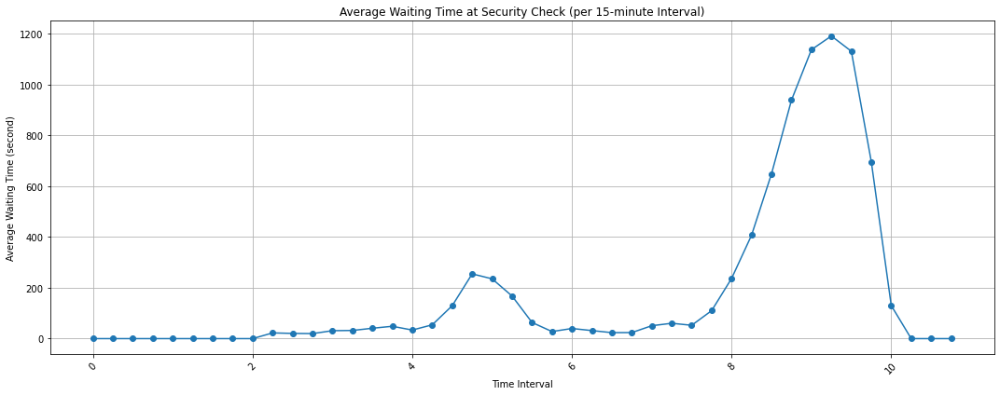

In [7]:
import matplotlib.pyplot as plt
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(simulation_result_df['Time in hour'], simulation_result_df['Average Waiting Time'], marker='o')
plt.title('Average Waiting Time at Security Check (per 15-minute Interval)')
plt.xlabel('Time Interval')
plt.ylabel('Average Waiting Time (second)')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()